In [1]:
import os
import time
from io import StringIO

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

import keyfi as kf
from keyfi.dimred import UMAP
from keyfi.cluster import HDBSCAN

from sklearn.preprocessing import StandardScaler, MaxAbsScaler


params

In [2]:
DATA_PATH = "../data/postProcessing/plane"
SNAPSHOT = "285140.078369"

#savepaths
figpath="../figures/scaling_test3_no_scaling_of_U"
embedding_path = os.path.join("../data/embeddings/scaling_test3_no_scaling_of_U", SNAPSHOT)

os.makedirs(figpath, exist_ok=True)
os.makedirs(embedding_path, exist_ok=True)

helper functions

In [3]:
def get_data(snapshot):
    return kf.import_vtk_data(
        os.path.join(DATA_PATH, snapshot, "data.vtk")
    )

data prep

In [4]:
df, mesh = get_data(SNAPSHOT)

df = pd.read_csv(StringIO(df.to_csv()), index_col=0)

cleaned_data = kf.clean_data(df, dim=2,
                             vars_to_drop=["N2", "NO2", "rho"]
                            )

features = [feature for feature in cleaned_data.columns[:-2]]
standard_scalers = ([StandardScaler] * len(cleaned_data.columns[:-2]))
maxabs_scalers = ([MaxAbsScaler] * len(cleaned_data.columns[:-2]))

features

['T', 'N2O4', 'Qdot']

UMAP params

In [5]:
n_neighbors_range = [200, 250, 300, 150]
min_dist_range = [0.1, 0.05]

scaling

In [6]:
cleaned_data300 = cleaned_data.copy()
cleaned_data300["Qdot"].clip(-300, 300, inplace=True)

cleaned_data200 = cleaned_data.copy()
cleaned_data200["Qdot"].clip(-200, 200, inplace=True)

cleaned_data400 = cleaned_data.copy()
cleaned_data400["Qdot"].clip(-400, 400, inplace=True)

In [7]:
maxabs200 = kf.scale_data(cleaned_data200, features, maxabs_scalers)
maxabs300 = kf.scale_data(cleaned_data300, features, maxabs_scalers)
maxabs400 = kf.scale_data(cleaned_data400, features, maxabs_scalers)

dimred

In [8]:
saved_embeddings = os.listdir(embedding_path)

for n_neighbors in n_neighbors_range:
    for data, scaling in zip((maxabs200, maxabs300, maxabs400), ("maxabs200", "maxabs300", "maxabs400")):
        for min_dist in min_dist_range:

            start_time = time.time()

            print(n_neighbors, min_dist, scaling)

            if f"{n_neighbors}_{min_dist}_{scaling}.npy" in saved_embeddings:
                embedding = np.load(
                    os.path.join(embedding_path, f"{n_neighbors}_{min_dist}_{scaling}.npy")
                    )
                print("loaded from existing")

            else:

                embedding, mapper = kf.embed_data(
                    data=data,
                    algorithm=UMAP,
                    n_neighbors=n_neighbors,
                    min_dist=min_dist,
                    #ensures reproducibility, disable for faster compute
                    # random_state=0,
                    #how many dimensions to reduce to
                    n_components=2,
                )

                np.save(
                    os.path.join(embedding_path, f"{n_neighbors}_{min_dist}_{scaling}"),
                    embedding
                )

            print("time:", time.time()-start_time)


200 0.1 maxabs200
time: 65.81021928787231
200 0.05 maxabs200
time: 55.2755765914917
200 0.1 maxabs300
time: 68.6453914642334
200 0.05 maxabs300
time: 54.36311626434326
200 0.1 maxabs400
time: 54.40544390678406
200 0.05 maxabs400
time: 72.81597399711609
250 0.1 maxabs200
time: 67.00048041343689
250 0.05 maxabs200
time: 67.17397379875183
250 0.1 maxabs300
time: 83.68708181381226
250 0.05 maxabs300
time: 67.00409936904907
250 0.1 maxabs400
time: 62.84463953971863
250 0.05 maxabs400
time: 178.15980768203735
300 0.1 maxabs200
time: 78.6689715385437
300 0.05 maxabs200
time: 78.24361419677734
300 0.1 maxabs300
time: 93.1118175983429
300 0.05 maxabs300
time: 77.96200704574585
300 0.1 maxabs400
time: 73.94780468940735
300 0.05 maxabs400
time: 96.83686757087708
150 0.1 maxabs200
time: 63.58530354499817
150 0.05 maxabs200
time: 122.09881830215454
150 0.1 maxabs300
time: 63.05931496620178
150 0.05 maxabs300
time: 48.3625864982605
150 0.1 maxabs400
time: 48.26248836517334
150 0.05 maxabs400
time: 6

make figures

/home/antoni/stuff/Rays/project/keyfi/keyfi/plot.py:106: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()
/home/antoni/stuff/Rays/project/keyfi/keyfi/plot.py:53: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(figsize = figsize)


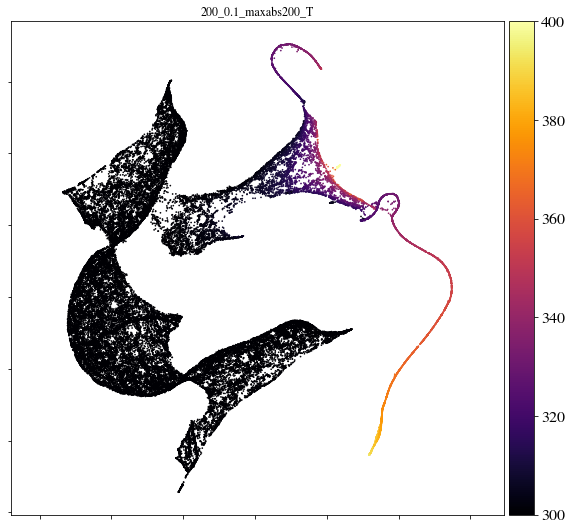

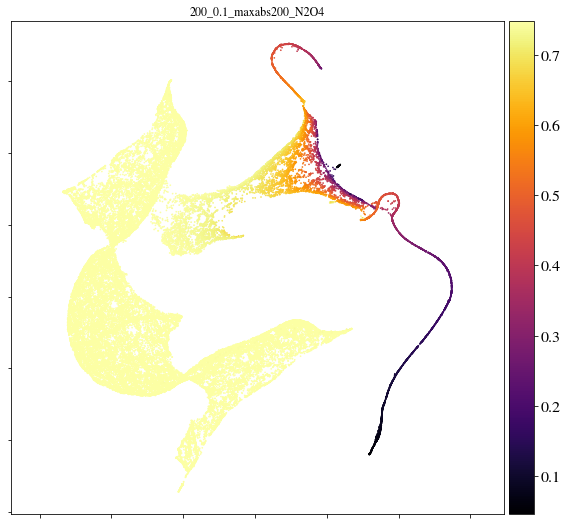

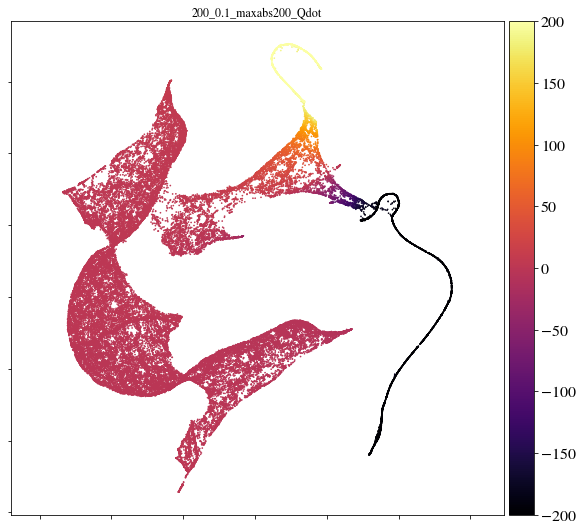

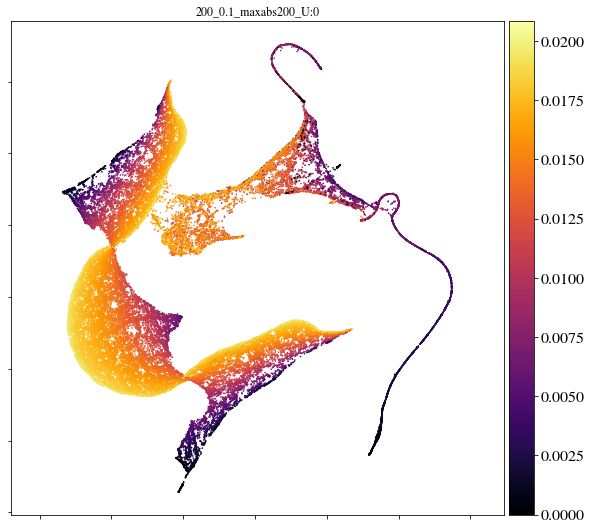

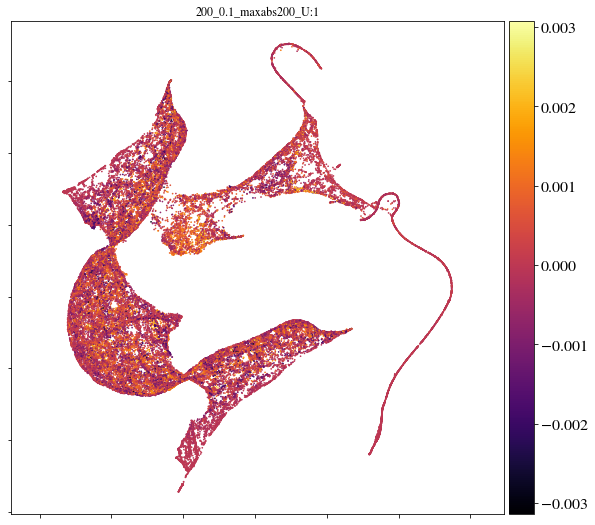

...

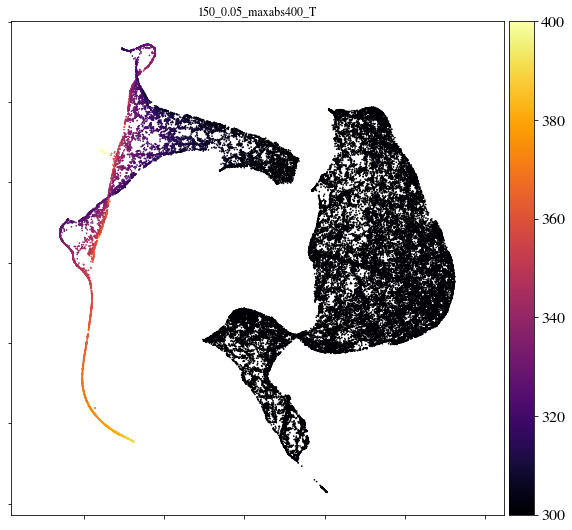

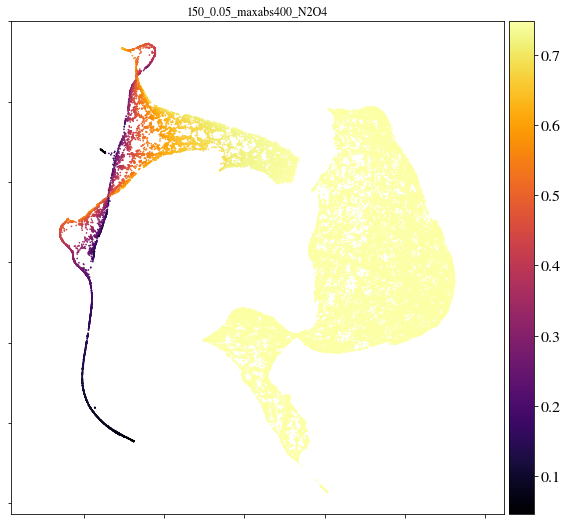

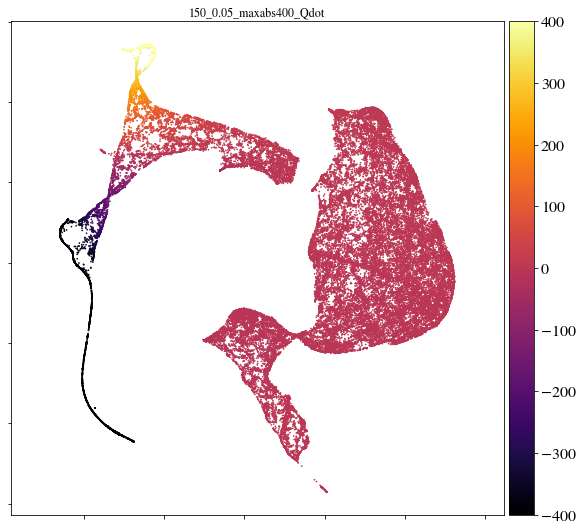

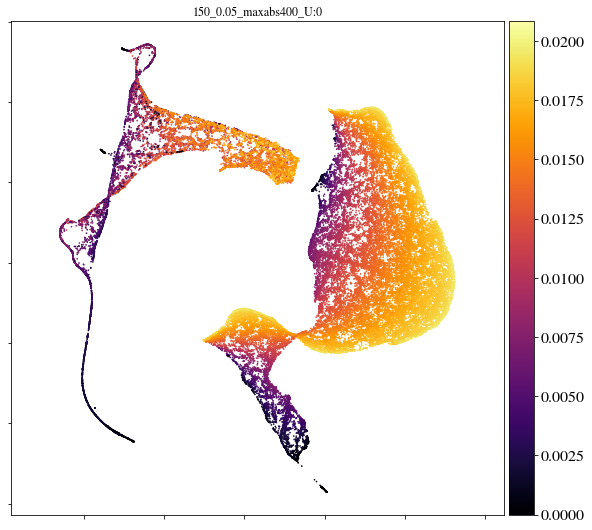

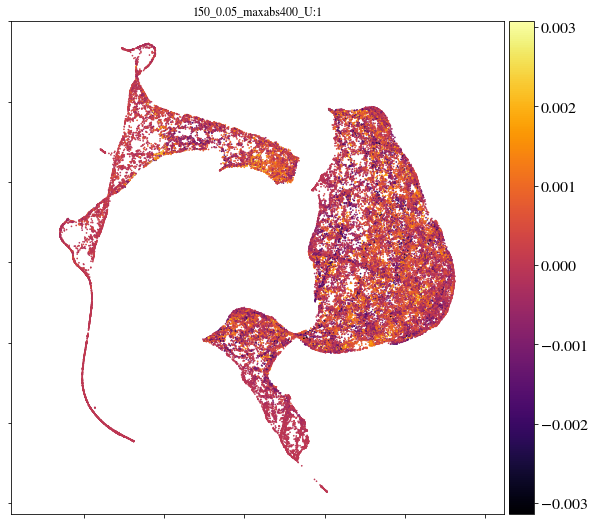

In [9]:
df, mesh = get_data(SNAPSHOT)

df = pd.read_csv(StringIO(df.to_csv()), index_col=0)

cleaned_data = kf.clean_data(df, dim=2,
                             vars_to_drop=["N2", "NO2", "rho"]
                            )

for n_neighbors in n_neighbors_range:
    for min_dist in min_dist_range:
        for scaling in ("maxabs200", "maxabs300", "maxabs400"):
            
            embedding = np.load(
                os.path.join(embedding_path, f"{n_neighbors}_{min_dist}_{scaling}.npy")
                )
            
            for var in cleaned_data.columns:
            
                if var == "Qdot":
                    if "200" in scaling:
                        cmap_minmax=[-200, 200]
                    elif "300" in scaling:
                        cmap_minmax=[-300, 300]
                    elif "400" in scaling:
                        cmap_minmax=[-400, 400]
                    else:
                        cmap_minmax=[]
                else:
                    cmap_minmax=[]

                kf.plot_embedding(
                    embedding=embedding,
                    data=cleaned_data,
                    scale_points = True,
                    cmap_var=var,
                    cmap_minmax=cmap_minmax,
                    save=True,
                    title=f"{n_neighbors}_{min_dist}_{scaling}_{var}",
                    figname=f"{n_neighbors}_{min_dist}_{scaling}_{var}",
                    figpath=figpath,
                    view=(None, None)
                )
                
            